In [ ]:
#!unzip "drive/My Drive/Dog Vision/dog-breed-identification.zip" -d "drive/My Drive/Dog Vision/"

# End to end Multiclass Dog breed Classification

This notebook builds an end to end multi class image classifier using TensorFlow and TensorFlow Hub.

##1. Problem

Identifying the breed of a dog given an image of a dog.


##2. Data

The Data we are using is from Kaggle's dog breed competition.

https://www.kaggle.com/competitions/dog-breed-identification

## 3.Evaluation

The Evaluation is a file with predictions probabilities for each dog breed of each test image.

www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

##4. Features

Some info about the data:
* We are dealing with images (unstructured data) so its better to use deep learning/ transfer learning.
* There arre 120 dog breeds (means that there is 120 different classes).
* There are around 10 000 images in the training set (these images have labels)
*  There are around 10 000 images in the test set(these images have no labels because we want to predict them)

### Get our  workspace Ready

* Import TensorFlow
* Import TensorFlow Hub
* Make sure we are using a GPU

In [ ]:
#Import TensorFLow into Colab

In [ ]:
#Import Necesary Tools

import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF hub version:", tf.__version__)

#Check for GPU availability
print ("GPU", "available(Yes!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.15.0
TF hub version: 2.15.0
GPU not available :(


## Getting our data ready (turning it into tensors)

With all machine learnig models, our data has to be in numerical format. So thats we will be doing first. Turning our images into ternsors(numerical representations)

Let's start by accesing our data and checking out the labels

In [ ]:
#Checkout the labels of our data
import pandas as pd
labels_csv= pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

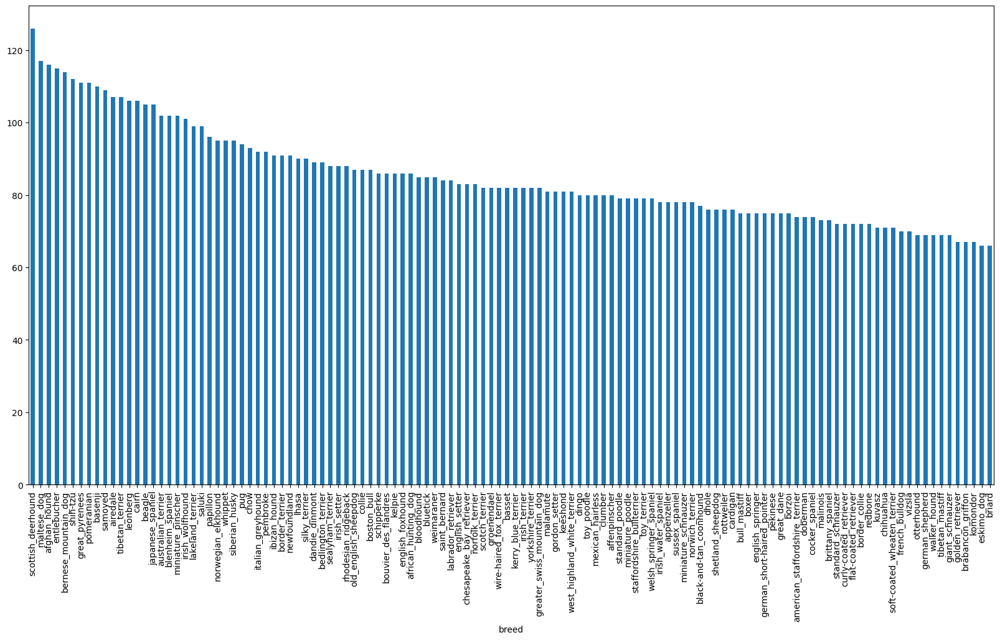

In [ ]:
#How many images are there for each bread
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

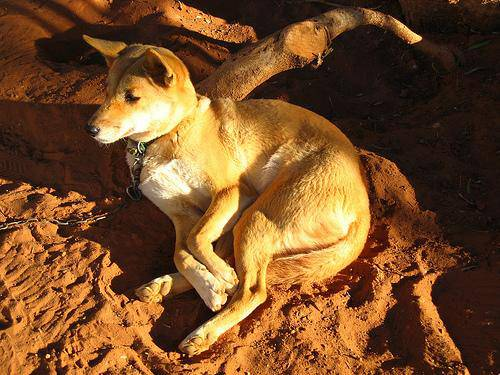

In [ ]:
#Lets view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their Labels

Let's get a list of all our images files pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
#Create pathnames from images IDs

In [ ]:
filenames=["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

#Check the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
#Check whether numbers of filenames matches numbers of actual image files
import os
if len(os.listdir("drive/My Drive/Dog Vision/train/"))== len(filenames):
  print("Filenames match actual amount of files!!! Proceed")
else:
  print("Filenames do not match actual amount of files, check the target directory")

Filenames match actual amount of files!!! Proceed


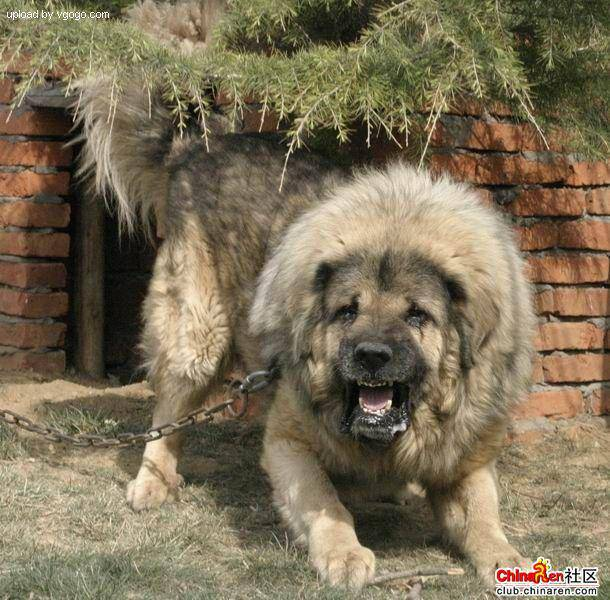

In [ ]:
#One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels= labels_csv["breed"].to_numpy()
#labels= np.array(labels) # Does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
## See if number of labels matches the number of filenames
if len(labels)== len(filenames):
  print("Number of labels matches numbers of filenames")
else:
  print("Number of labels does not match number of filenames, check data directories")

Number of labels matches numbers of filenames


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
#Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#Trun every label into a boolean array
boolean_labels=[label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
#Example: turning boolean array into integers
print(labels[0]) # Original label
print(np.where(unique_breeds == labels[0])) #index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # There will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own Validation Set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own  

In [ ]:
#Set X & Y variables

x = filenames
y= boolean_labels

In [ ]:
len(filenames )

10222

We are going to start experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max: 10000, step:1000}

In [ ]:
#Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

#Split them into training and validation of total size NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
#Lets have a look at the training data
x_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing Images (turning images into tensors )

To preprocess our images into Tensors we are going to write a funtion wich does a few things:
1. Take an image filepath as input
2. Use tensor Flow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into tensors
4. Resize the `image` to be a shape of (224,224)
5. Return the modify `image`

In [ ]:
#Before we do, lets see what omporting an image looks like
# Convert an Image to nNumpy array
from matplotlib.pyplot import imread
image= imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
# Turn image into a Tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we have seen how an image looks like as a tensor, lets make a funtion to preprocess them

1. Take an image filepath as input
2. Use tensor Flow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into tensors
4. Normalize our image(convert color chanel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224,224)
6. Return the modify `image`

In [ ]:
#Define image size
IMG_SIZE = 224

#Create a function to preprocessing images
def process_image(image_path, img_size= IMG_SIZE):
  """
  Takes an image file path and turns the image into a tensor
  """
  #Read an Image File
  image = tf.io.read_file(image_path)
  #Turn the jpg image into numerical Tensor with 3 color channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)
  #Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  #Resize the image to our desired value (244,244)
  image= tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


## Turning our data into batches

Why turn data into batches?

Lets say you are trying  to process 10 000+ images in the go... they all might not fit into memory.

Thats why we do about 32(batch size) images at the time (you can manually adjust the batch size if need be )

In order to use TensorFlow effectively, we need our data in the form of Tensor tupples which look like this:

`(image, label)`.

In [ ]:
#Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and return  a type of (image, label)
  """
  image = process_image(image_path)
  return image, label

In [ ]:
#Demo of above
(process_image(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we got a way to turn our data into tupples of tensors in the form:`(image, label)`, lets make a funtion to turn all of our data (x & y) into batches!

In [ ]:
#Define the batch size, 32 is a good start
BATCH_SIZE =32

#Create a funtion to turn data into batches
def create_data_batches(x, y=None, batch_size= BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of images (x) and label (y) pair.
  Shuffles the data if its training data but doesn't shuffle if it's validation data
  Also accepts test data as imput (no lables).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data= tf.data.Dataset.from_tensor_slices((tf.constant(x)))#Only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  #If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating data batches...")
    data= tf.data.Dataset.from_tensor_slices((tf.constant(x), #filepaths
                                              tf.constant(y))) # labels

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    #Turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))

    #Shuffling pathnames and labels before mapping image processor funtion is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    #Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data= data.map(get_image_label)

    #Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [ ]:
#Create training and validation data Batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches (x_val, y_val, valid_data=True)

Creating training data batches...
Creating data batches...


In [ ]:
#Check the different atrubutes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however  these can be a little hard to understand/comprehend, let's vizualize them

In [ ]:
import matplotlib.pyplot as plt
from numpy import argmax

#Create a function for viewing images in data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  #Setup the figure
  plt.figure(figsize=(10, 20))
  #Loop through 25 (for displaying 25 images )
  for i in range (25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    #Display an image
    plt.imshow(images[i])
    #Add image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    #Turn the grid lines off
    plt.axis("off")

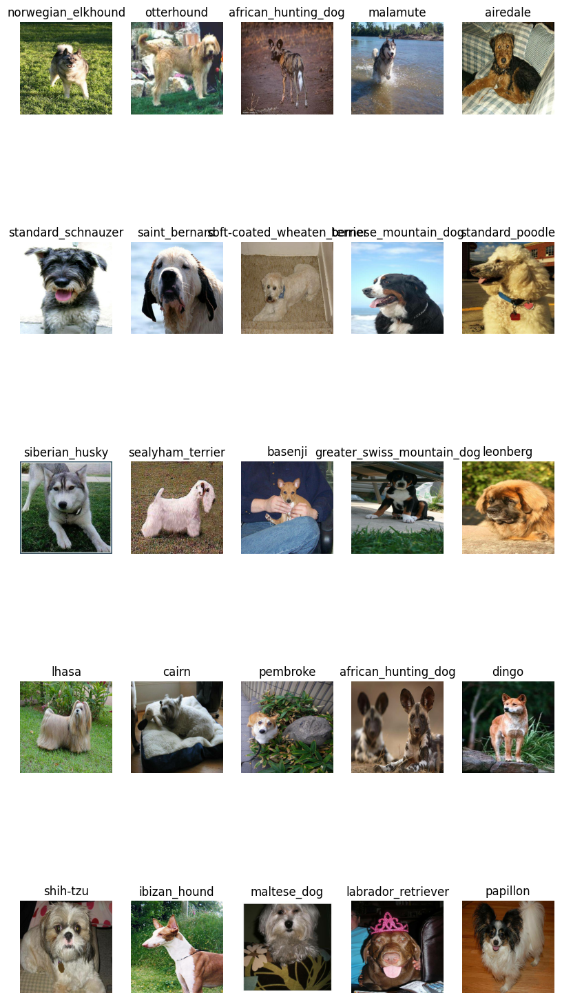

In [ ]:
# Now lets visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

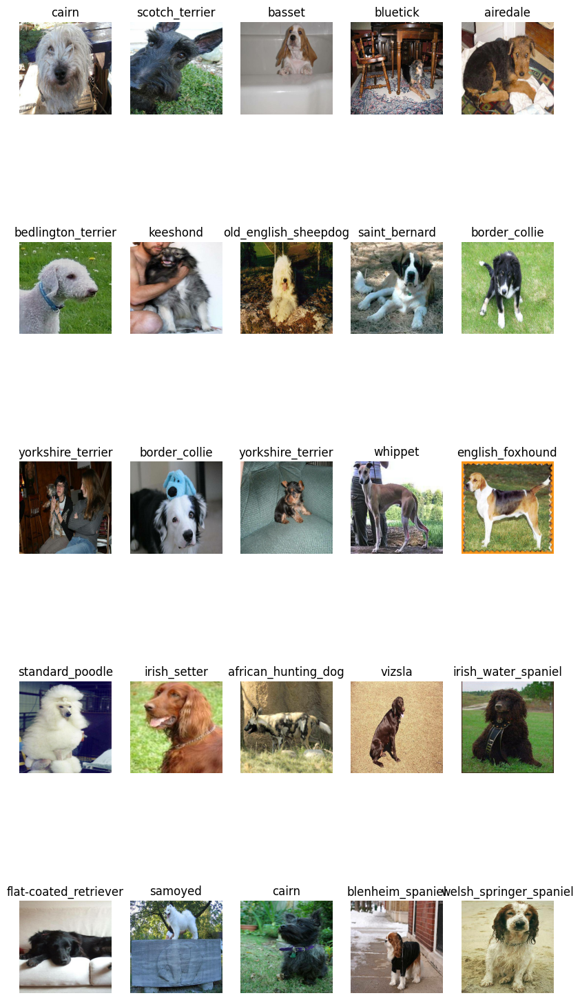

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of tensors) to our model.
* The output shape(image labels, in the form of tensors) of our model.
* The URL of the model we want to use

In [ ]:
# Setup input shape to the model
INPUT_SHAPE= [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, colour channels

#Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

#Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"


Now we've got our imputs, outputs and model ready yo go. Let's put them together into Keras deep learning model!

Knowing this, lets create a function wich:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in a sequential fashion(do this first , then this, then that )
* Compiles the model (says how it should be evaluated and improved)
* Build the model (tells the model the imput shape it will be getting )
* Return the model

All of these steps can be found: tensorflow/guide/keras/overview

In [ ]:
#!pip install tensorflow==2.15.0
#!pip install tensorflow-hub keras==2.15.0

import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras import layers
#from tensorflow.keras.models import Sequential
print("TF version:", tf.__version__)
print("TF hub version:", tf.__version__)


#Create a funciton wich builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url= MODEL_URL):
  print("Building model with:", MODEL_URL)

  #Setup the model layers
  model= tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") #Layer 2 (output layer)
  ])

  #Compile the model
  model.compile(
      loss= tf.keras.losses.CategoricalCrossentropy(),
      optimizer= tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model


TF version: 2.15.0
TF hub version: 2.15.0


In [ ]:
model=create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
outputs = np.ones(shape=(1,1, 1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating Callbacks

Callbacks are helper functions that a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We will create two callbacks, one for TensorBoard which helps track our model progress, and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a tensorboard callback, we need to do 3 things:

1. Load the tensorboard notebook extension
2. Create a TensorBoard callback which is able to save logs to a dictionary and pass it to our model's `fit()` function.
3. Visualize our models trainings logs with the `%tensorboard` magic function (we will do this after model training)

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [59]:
import datetime

#Create a funtion to build a tensorboard callback
def create_tensorboard_callback():
  #Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vison/logs",
                        #Make it so the logs get tracked when ever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping Callback

Early Stopping  helps stop our model from overfitting by stopping training if a certain evaluation metric stop improving

In [ ]:
# Create early stopping callback

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_accuracy", patience=3
)

#Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type: "slider", min: 10, max:100, step:10}

In [ ]:
# Check to make sure we are still running on a GPU
print("GPU", "available(Yes!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU not available :(


Lets create a function wich trains a model

* Create a model using `create_model()`
* Set up a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` funtion on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we would like to use
* Return the model

In [55]:
#Build a funtion to train and retun a trained model
def train_model():
  """
  Trains a given model and returns the trained version
  """
  #Create a model
  model = create_model()

  #Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  #Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs= NUM_EPOCHS,
            validation_data= val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  #Return the fitted model

  return model

In [56]:
#Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 171s 7s/step - loss: 4.6658 - accuracy: 0.1063 - val_loss: 3.4433 - val_accuracy: 0.2600
Epoch 2/100
25/25 [==============================] - 69s 3s/step - loss: 1.6953 - accuracy: 0.6612 - val_loss: 2.1222 - val_accuracy: 0.4950
Epoch 3/100
25/25 [==============================] - 72s 3s/step - loss: 0.5789 - accuracy: 0.9463 - val_loss: 1.6506 - val_accuracy: 0.5600
Epoch 4/100
25/25 [==============================] - 63s 3s/step - loss: 0.2605 - accuracy: 0.9862 - val_loss: 1.4642 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 73s 3s/step - loss: 0.1493 - accuracy: 0.9950 - val_loss: 1.3827 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 82s 3s/step - loss: 0.1036 - accuracy: 1.0000 - val_loss: 1.3233 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================] - 69s 3s/

**Question:** It looks like our model is overfittiong because it is perfroming far better on the training dataset than validation set, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! it means our model is learning!!!

### Checking the Tensorboard logs

The TensorBoard magic funtion (`%tensorboard`) will acces the logs direcory we created early and visualize its contents

In [58]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

# Making and Evaluatig predictions using a trained model

In [60]:
#Make predictions on the validation data(not used to train on )
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 19s 3s/step


array([[2.50106584e-03, 1.62689801e-04, 8.52312136e-04, ...,
        2.68698699e-04, 1.58150560e-05, 5.79394808e-04],
       [5.95838472e-04, 2.14750937e-04, 4.43670014e-03, ...,
        3.16315563e-04, 1.04568712e-03, 8.92018434e-05],
       [1.09599364e-06, 4.25438775e-05, 1.26500308e-05, ...,
        2.68542808e-05, 9.49533023e-06, 1.70392799e-04],
       ...,
       [9.17992656e-06, 1.08167056e-04, 4.97283581e-05, ...,
        2.15664113e-06, 2.91436572e-05, 1.73164190e-05],
       [2.66193226e-03, 8.33843078e-05, 3.36666017e-05, ...,
        5.23093113e-05, 9.01576459e-06, 7.89250713e-04],
       [6.75766263e-04, 4.88322803e-05, 3.13496008e-03, ...,
        1.04705861e-03, 1.31591584e-03, 3.77988996e-04]], dtype=float32)

In [66]:
np.sum(predictions[0])

0.9999999

In [68]:
#First prediction
index = 42

print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[2.50106584e-03 1.62689801e-04 8.52312136e-04 1.48257532e-04
 2.32344479e-04 1.45982749e-05 5.89461531e-03 8.96201469e-04
 1.09318455e-04 4.23232443e-04 4.51754779e-04 2.06983896e-04
 8.61701265e-05 1.98386915e-04 7.00661738e-04 2.86794704e-04
 1.11896035e-04 2.94385791e-01 2.29116631e-05 1.70137282e-05
 1.21304276e-03 1.04935913e-04 6.14887613e-05 3.68474575e-04
 2.11319457e-05 2.80524473e-05 4.80257571e-01 1.25315579e-04
 3.45077977e-04 1.91180501e-04 4.88243531e-05 2.09319827e-04
 1.42157322e-03 1.49991047e-05 8.78289575e-05 4.93529812e-03
 1.70013191e-05 3.54337273e-04 3.51015915e-05 4.23725578e-05
 6.00884145e-04 4.10847133e-05 2.37862769e-04 4.99491216e-05
 2.05059805e-05 7.31734253e-05 1.36824565e-05 9.28349036e-05
 1.36820861e-04 8.55871549e-05 3.33771168e-04 6.10367933e-05
 8.31528101e-04 8.76107879e-05 1.23012069e-04 1.07883105e-04
 3.18319828e-04 1.57863135e-03 2.33803716e-04 2.45115533e-02
 3.09671974e-04 5.76342245e-06 7.48374918e-03 6.17919140e-05
 4.27409250e-04 1.002327

Having the  above funtionality is great but we want ti be able to do it at scale

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities also know as confidence levels

In [69]:
# Turn predicitions probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

#Get a predicted label based on an array of prediction pronbabilities
pred_label= get_pred_label(predictions[0])
pred_label

'cairn'

Since our validation data is still in a batch dataset, we will have to un batch it to make predictions on the validations images and then compare those predictions on the validation labels(truth labels)

In [73]:
#Create a function to unbatch dataset

In [79]:
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns seperate arrays
  of images and labels
  """
  images = []
  labels = []
  #Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [75]:
get_pred_label(predictions[0])

'cairn'

Now we have got ways to get:
* Prediction labels
* Validation Labels (truth labels)
* Validation images

Lets make some funtions to make all a bit more visual

We will create a funtion wich:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers
* Convert the prediction probabilities  to a predicted label
* Plot the predicted label, its predicted probability, the truth label and the target image on a single shot

In [82]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  #Get the pred label
  pred_label= get_pred_label(pred_prob)

  #Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  #Change plot title to be predicted, probability of prediction and truth label

  #Change the plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

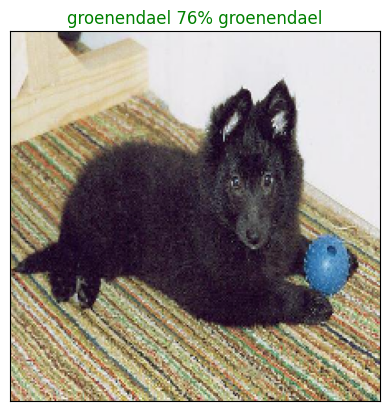

In [85]:
plot_pred(prediction_probabilities = predictions,
          labels= val_labels,
          images=val_images,
          n=77)

Now we got one function to visualize our models top predictions, lets make another to view our top 10 predictions

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Predictions probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [92]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  #Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  #Find the top 10 prediction confidence values

  top_10_pred_values = pred_prob[top_10_pred_indexes]

  #Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  #Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  #Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

In [93]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.48025757, 0.2943858 , 0.03001176, 0.02451155, 0.02027786,
       0.01388103, 0.01313608, 0.01116614, 0.01027599, 0.01002327],
      dtype=float32)

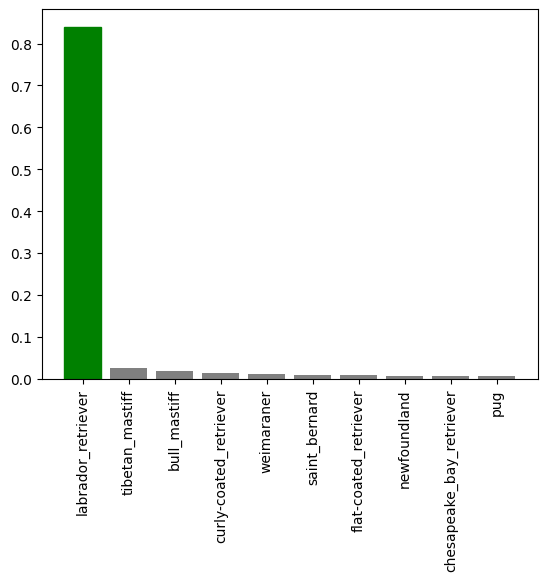

In [98]:
plot_pred_conf(prediction_probabilities= predictions, labels= val_labels, n=40)

Now we have got some functions to help us to visualize our predictions and evaluate our model, lets check out a few

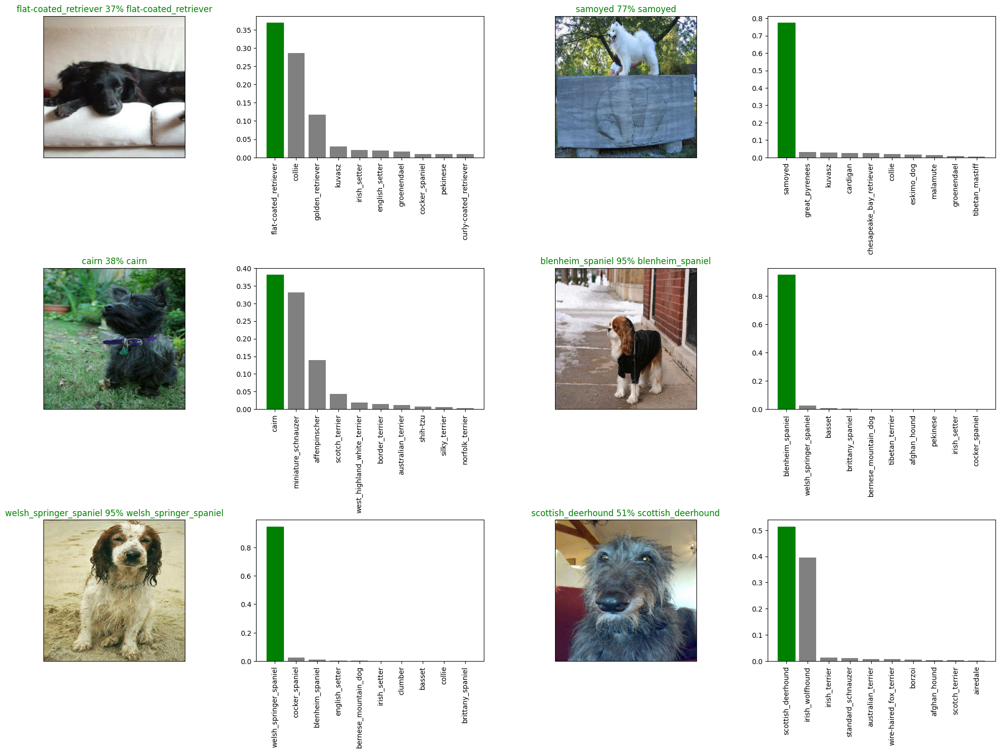

In [103]:
#Check out a few predictions and their different values
i_multiplier= 20
num_rows = 3
num_cols= 2
num_images = num_rows*cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and Reloading a trained model

In [104]:
#Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for separating models from each other
  """
  #Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [105]:
# Create a funtion to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we have got funtions to save and load a trained model, lets make sure they work

In [106]:
#Save our model trained on 1000 images
save_model(model, suffix = "1000-images-mobilenetv2-Adam")


Saving model to: drive/MyDrive/Dog Vision/models/20250418-024402-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20250418-024402-1000-images-mobilenetv2-Adam.h5'

In [110]:
#Load a trainded model
loaded_1000_image_model = load_model('drive/MyDrive/Dog Vision/models/20250418-024402-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20250418-024402-1000-images-mobilenetv2-Adam.h5


In [108]:
# Evaluate the presaved model
model.evaluate(val_data)

7/7 [==============================] - 17s 2s/step - loss: 1.2137 - accuracy: 0.6700


[1.2136826515197754, 0.6700000166893005]

In [111]:
#Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 14s 2s/step - loss: 1.2137 - accuracy: 0.6700


[1.2136826515197754, 0.6700000166893005]

### Training a big Model (on the full data)

In [112]:
len(x), len(y)

(10222, 10222)

In [113]:
#Create a data batch with the full data set
full_data = create_data_batches(x, y)

Creating training data batches...


In [114]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [115]:
#Create a model for a full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [116]:
#Create full model callbacks
full_model_tensorboard= create_tensorboard_callback()

#No validation set when trainig on all data, so we can't monitor validation accuracy

#Create early stopping callback
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                             patience=3)

In [ ]:
# Running the cell below will take up to 60 min because the gpu we are using has to load all the images into memory

In [ ]:
#Fit the full model to the full data

#full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

In [ ]:
#Load in the full model
loaded_full_model = load_model("drive/MyDrive/Dog Vision/models/20250418-024402-full-image-set-mobilenetv2-Adam.h5")

## Making Predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we will have to get it in the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we will:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches` and setting the `test data` parameter to`True` (since the test data doesnt have labels.)
* Make predictions array by passing the test batches to the `predict()` method called on our model

In [117]:
#Load test image Filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/def88eeacc633cbc3d46d5f5fb495379.jpg',
 'drive/MyDrive/Dog Vision/test/deed28298a869f87cf0372f592a21d43.jpg',
 'drive/MyDrive/Dog Vision/test/dcdffa00518844bd21499db49979f9c8.jpg',
 'drive/MyDrive/Dog Vision/test/ddbb53bb7ea7060847a0bd4554877e80.jpg',
 'drive/MyDrive/Dog Vision/test/e726ac27864ecbde1f5822c4d6e26c17.jpg',
 'drive/MyDrive/Dog Vision/test/e386eaa78980be7183ecfdd32ecd2aab.jpg',
 'drive/MyDrive/Dog Vision/test/dfe02d52ca281aaca6215a42fee6245c.jpg',
 'drive/MyDrive/Dog Vision/test/e65d6492c026c925660d80543664b8a7.jpg',
 'drive/MyDrive/Dog Vision/test/e70ffd525a15ed3eb30a8c25869bc755.jpg',
 'drive/MyDrive/Dog Vision/test/ddf2401701ee374c0f1f9dd607071ec7.jpg']

In [118]:
#Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [119]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Callinf `predict()` on our full model and passing it the test data batch take a long time to run (about 1 hr)

In [ ]:
#Make predictions on test data batch using  the loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

In [ ]:
#Save predictions (Numpy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
#Load Predictions (Numpy Array) from CSV file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/test_predictions.csv", delimiter=",")

##Preparing test data set for Kaggle

Looking at the  kaggle sample submission, we find that it wants our models predictions probability outputs in a dataFrame with an ID column for each different dog breed.

To get the data in this format, we will:

* Create a pandas DataFrame with an ID colum as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add Data(the predictions probabilities) to each of the dog breed columns
* Export dataFrame as a CSV to submit it to kaggle

In [120]:
#Create a pandas DataFrame with empy columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DF
test_ids = [os.path.splitext(path)[0]for path in os.listdir(test_path)]
preds_df["id"]= test_ids
preds_df.head()

In [ ]:
#Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

In [ ]:
#Save our predictions dataFrame to CSV for submission to Kaggle
preds_df.to_csv('drive/My Drive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv', index=False)

#Making predictions on customs images

To make predictions on custom images we will:

* Get the filepaths of our own images
* Turn filepaths into data batches using `create_data_batches()`. And Since our custom images wont habe labels, we set the `test data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images
